In [1]:
import os
import sys
import PATH
import re
from importlib import reload

import numpy as np
import pandas as pd

from models import MTL_models
from models import log_and_save as LAS
from matplotlib import pyplot as plt

/home/wergillius/Project/UTR_VAE


In [2]:
reload(LAS)

<module 'models.log_and_save' from '/home/wergillius/Project/UTR_VAE/models/log_and_save.py'>

In [3]:
def read_log_of_a_dir(log_dir,**kwarg):
    """
    ...log_dir : abs path of log dir
    """
    file_ls = [file for file in os.listdir(log_dir) if ".log" in file]
    log_path = [os.path.join(log_dir,file) for file in file_ls]
    log_name = [file.replace('.log','') for file in file_ls]
    log_ls = [LAS.Log_parser(file,**kwarg) for file in log_path]
    return log_ls,log_name

# MODEL : PRE-TRAIN encoder
- Conv_AE
- Conv_VAE

In [10]:
log_AE =  LAS.Log_parser("/home/wergillius/Project/UTR_VAE/log/Conv_AE_MTL/test_setting/pre_train_enc.log")
log_VAE = LAS.Log_parser("/home/wergillius/Project/UTR_VAE/log/Conv_VAE_MTL/setting1/pre_train_venc.log")

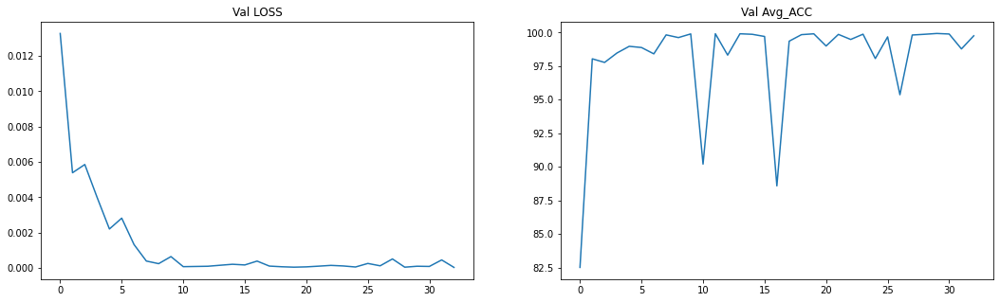

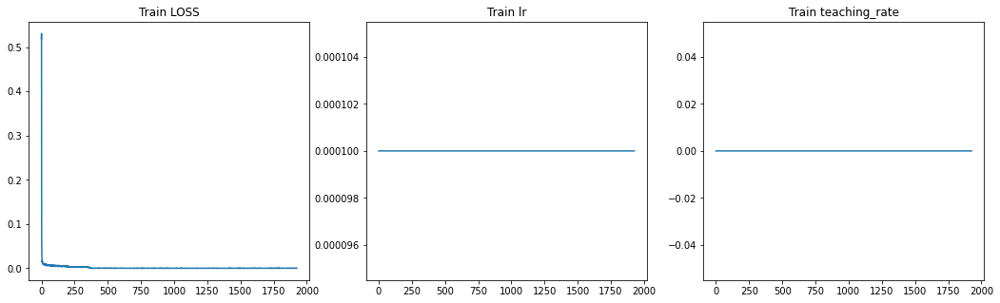

In [11]:
log_AE.plot_val_metric()
log_AE.plot_val_metric(dataset='train')

# MODEL : Baseline

## setting: test run

In [170]:
log_test,log_test_name = read_log_of_a_dir("/home/wergillius/Project/UTR_VAE/log/Baseline_MTL/test_run")

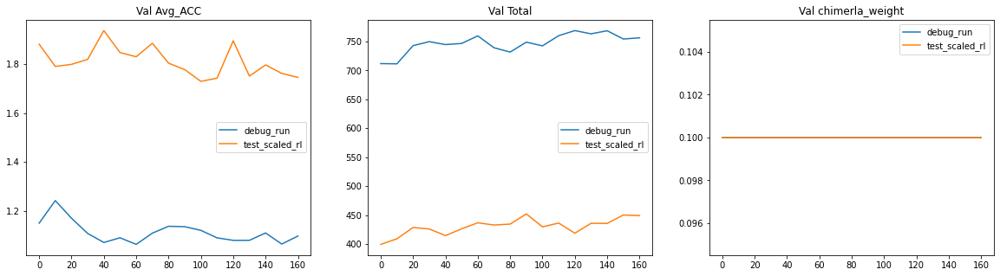

In [171]:
LAS.plot_a_exp_set(log_test,log_test_name)

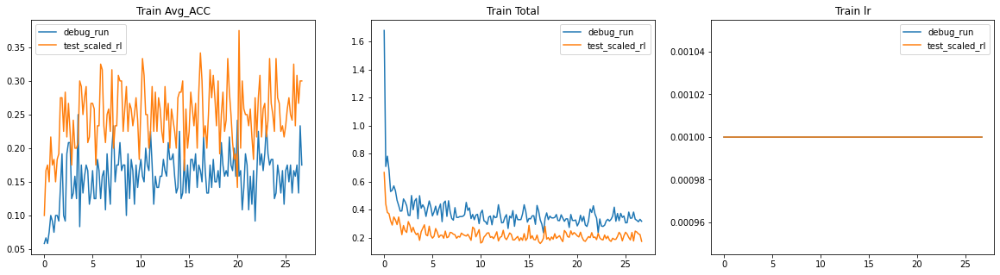

In [173]:
LAS.plot_a_exp_set(log_test,log_test_name,dataset='train',mean_of_train=5)

## setting :Loss function

In [193]:
log_loss, log_loss_name = read_log_of_a_dir("/home/wergillius/Project/UTR_VAE/log/Baseline_MTL/Loss_function")

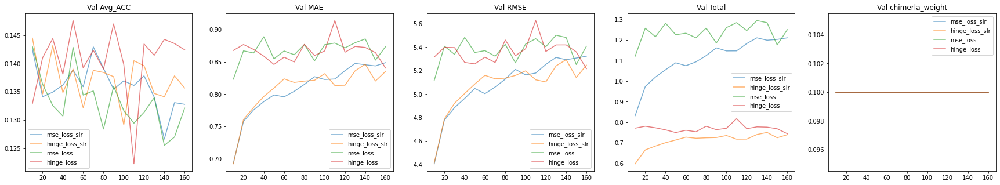

In [203]:
LAS.plot_a_exp_set(log_loss,log_loss_name,fig=plt.figure(figsize=(30,5)),alpha=0.6,start_from=1)

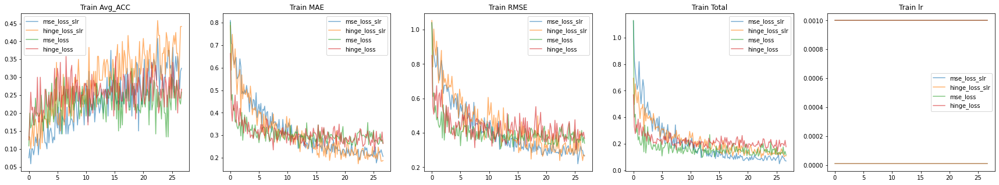

In [198]:
LAS.plot_a_exp_set(log_loss,log_loss_name,dataset='train',mean_of_train=5,fig=plt.figure(figsize=(30,5)),alpha=0.6)

## setting : unmod_df

In [204]:
log_unmod , log_unmod_name = read_log_of_a_dir("/home/wergillius/Project/UTR_VAE/log/Baseline_MTL/unmod_df")

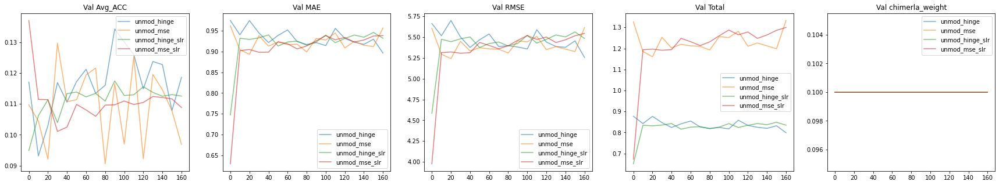

In [205]:
LAS.plot_a_exp_set(log_unmod,log_unmod_name,fig=plt.figure(figsize=(30,5)),alpha=0.6)

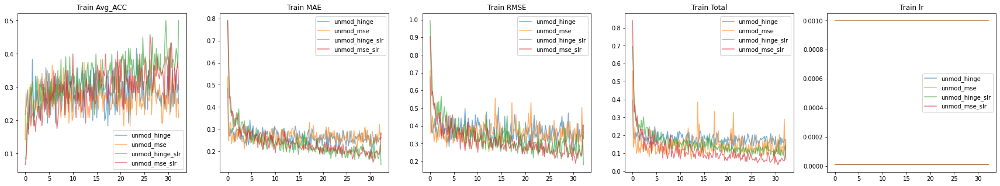

In [207]:
LAS.plot_a_exp_set(log_unmod,log_unmod_name,fig=plt.figure(figsize=(30,5)),alpha=0.6,dataset='train',mean_of_train=5)

## setting : L-50

In [37]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Baseline/Baseline_MTL/L_50"
log_l50, log_name_50 = read_log_of_a_dir(log_dir)

In [39]:
log_name_50

['debug_run', 'more_dropout', 'mild_dropout', 'l2_reg', 'blr']

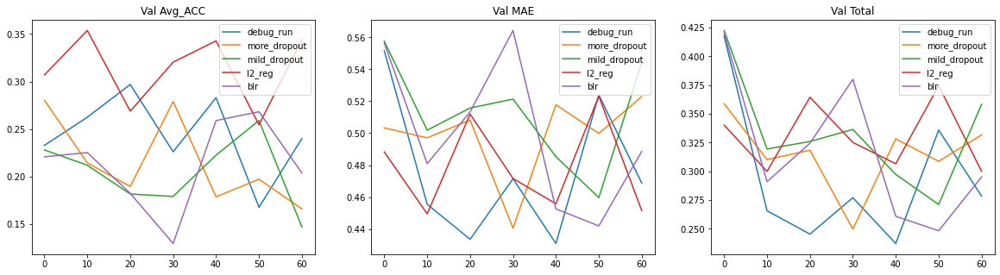

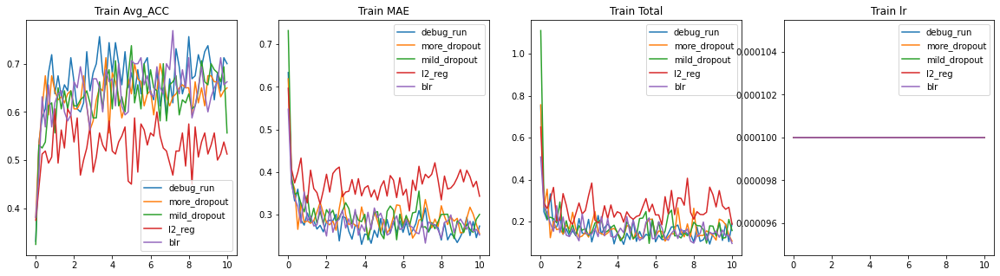

In [38]:
LAS.plot_a_exp_set(log_l50,log_name_50)
LAS.plot_a_exp_set(log_l50,log_name_50,dataset='train',mean_of_train=5)

# MODEL : TO_SEQ_TE

- TE: by_range

## test setting

In [22]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/MTL/TO_SEQ_TE_MTL/test_setting"

all_file = [os.path.join(log_dir,file) for file in  os.listdir(log_dir) if '.log' in file]

# discard 1-100
all_file.remove(all_file[4])

all_file

log_ls = [LAS.Log_parser(file) for file in all_file]

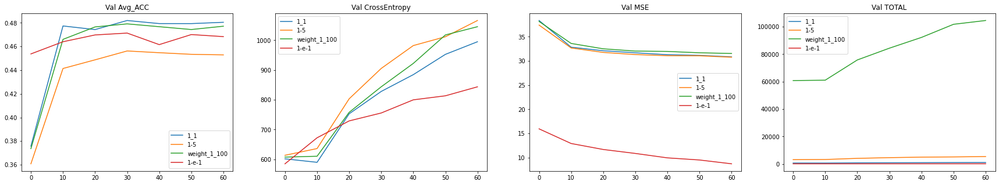

In [23]:
LAS.plot_a_exp_set(log_ls,log_name_ls=['1_1','1-5','weight_1_100','1-e-1'],fig=plt.figure(figsize=(30,5)))

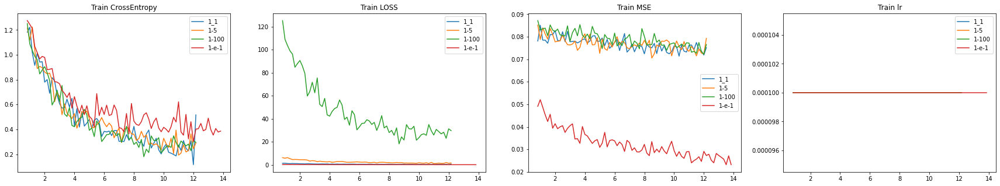

In [31]:
LAS.plot_a_exp_set(log_ls,log_name_ls=['1_1','1-5','1-100','1-e-1','1-e-2'],
                   dataset='train',fig=plt.figure(figsize=(30,5)),
                   start_from=5,mean_of_train=5
                  )

## Big learning rate

In [19]:
log_dir="/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/big_lr"
all_file = [os.path.join(log_dir,file) for file in  os.listdir(log_dir) if '.log' in file]

In [20]:
all_file

['/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/big_lr/weight_1_e-2_sche.log',
 '/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/big_lr/weight_1_5e-3.log',
 '/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/big_lr/weight_1_e-2_slr.log']

In [21]:
log_ls=[LAS.Log_parser(file) for file in all_file]
log_name = [file.split('weight_')[1].replace(".log","") for file in all_file]

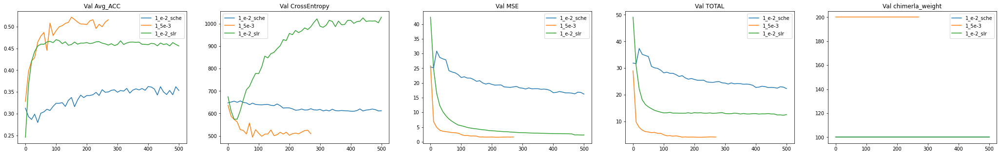

In [22]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(36,5)))

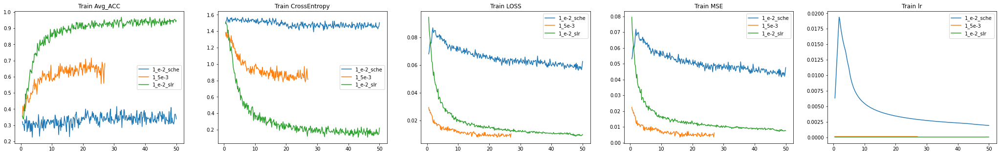

In [23]:
LAS.plot_a_exp_set(log_ls,log_name,dataset='train',start_from=3,mean_of_train=10,fig=plt.figure(figsize=(36,5)))

## setting : small learning rate and reg
- learning rate
    - defualt lr : 1e-4
    - slr :        1e-5


- L2 : weight decay
    - defualt l2 : 1e-4
    - reg     l2 : 1e-3

In [33]:
log_path = "/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/slr_reg"
file_ls = [file for file in os.listdir(log_path) if '.log' in file]
file_path = [os.path.join(log_path,file) for file in file_ls]
log_name = [file.replace(".log","") for file in file_ls]

In [34]:
log_ls = [LAS.Log_parser(log) for log in file_path]

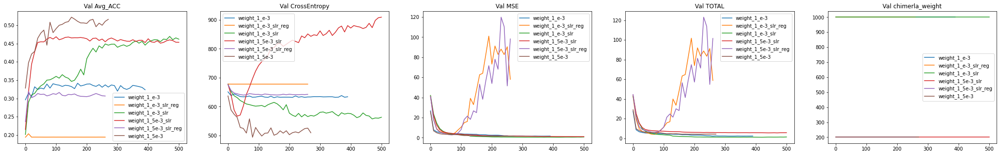

In [26]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(36,5)))

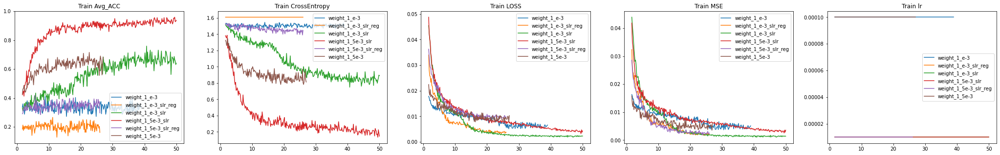

In [35]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(36,5)),dataset='train',start_from=10,mean_of_train=10)

## 0 weight

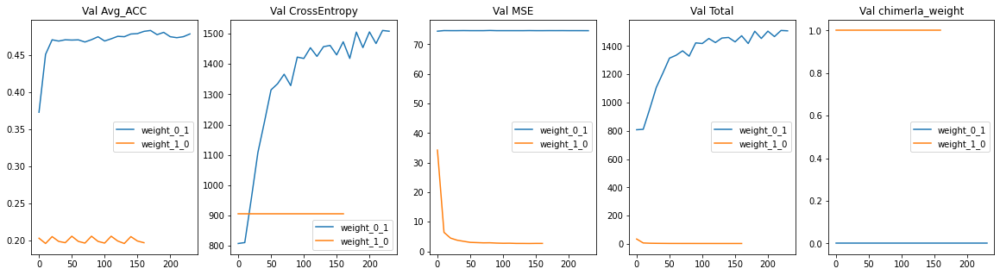

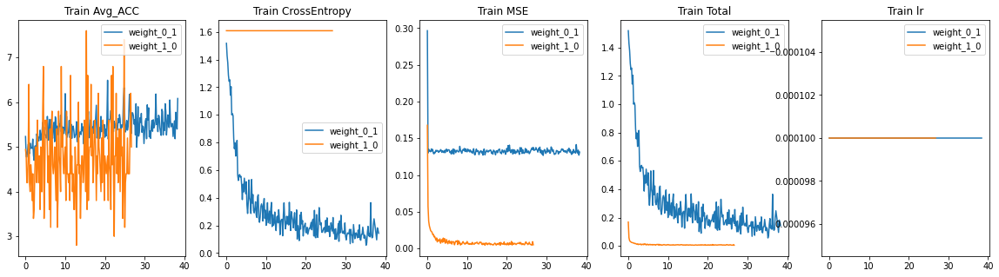

In [112]:

log_path="/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/weight_0"
file_ls = [file for file in os.listdir(log_path) if '.log' in file]
file_path = [os.path.join(log_path,file) for file in file_ls]
log_name = [file.replace(".log","") for file in file_ls]
log_ls = [LAS.Log_parser(log) for log in file_path]

LAS.plot_a_exp_set(log_ls,log_name)

LAS.plot_a_exp_set(log_ls,log_name,dataset='train',mean_of_train=5)

## setting : Different_L2

In [128]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/different_L2"
file_ls = [file for file in os.listdir(log_dir) if ".log" in file]
file_path = [os.path.join(log_dir,file) for file in file_ls]
log_name = [file.replace('.log','') for file in file_ls]

In [129]:
log_ls = [LAS.Log_parser(file) for file in file_path]

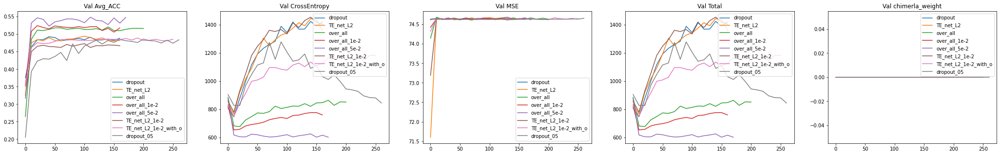

In [132]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(36,5)))

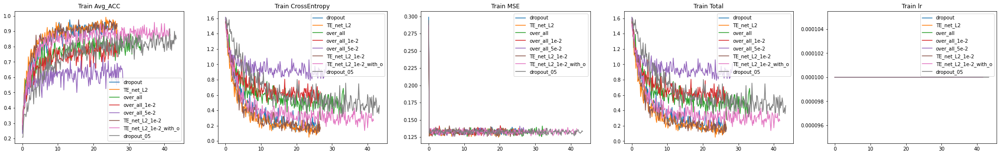

In [134]:
LAS.plot_a_exp_set(log_ls,log_name,dataset='train',mean_of_train=5,fig=plt.figure(figsize=(36,5)))

## setting : reg version test

In [217]:
log_regtest,log_regtest_name = LAS.read_log_of_a_dir("/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/reg_version_test")

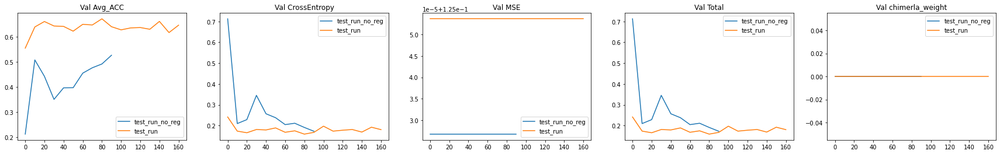

In [220]:
LAS.plot_a_exp_set(log_regtest,log_regtest_name,fig=plt.figure(figsize=(30,4)))

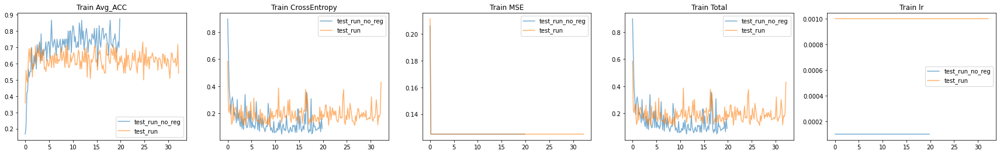

In [222]:
LAS.plot_a_exp_set(log_regtest,log_regtest_name,fig=plt.figure(figsize=(30,4)),dataset='train',mean_of_train=5,alpha=0.6)

## setting reg_version weight finder


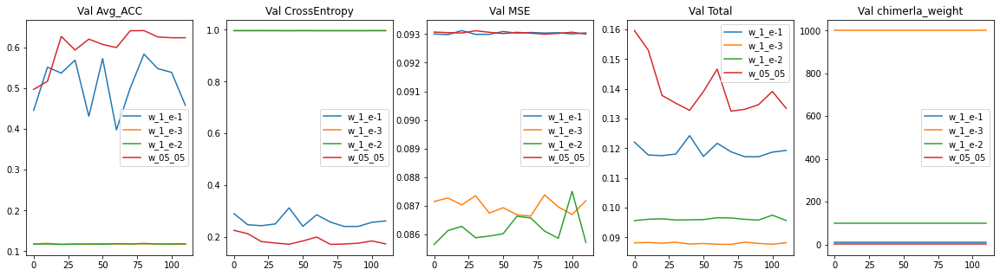

In [236]:
log_wf,log_wf_name = LAS.read_log_of_a_dir("/home/wergillius/Project/UTR_VAE/log/TO_SEQ_TE_MTL/reg_version_weight_finder")
LAS.plot_a_exp_set(log_wf,log_wf_name)

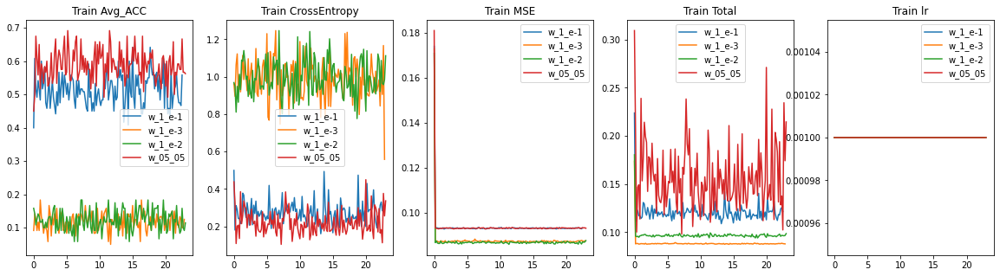

In [237]:
LAS.plot_a_exp_set(log_wf,log_wf_name,dataset='train',mean_of_train=5)

# MODEL: TWO_TASK_AT

## setting : /home/wergillius/Project/UTR_VAE/log/TWO_TASK_AT_MTL/weight_finder

In [290]:
log_path = "/home/wergillius/Project/UTR_VAE/log/TWO_TASK_AT_MTL/weight_finder"
file_ls = [file for file in os.listdir(log_path) if '.log' in file]
# file_ls.remove('weigt_e-1_1.log')
file_path = [os.path.join(log_path,file) for file in file_ls]
log_name = [file.replace(".log","") for file in file_ls]

In [291]:
log_ls = [LAS.Log_parser(file) for file in file_path]

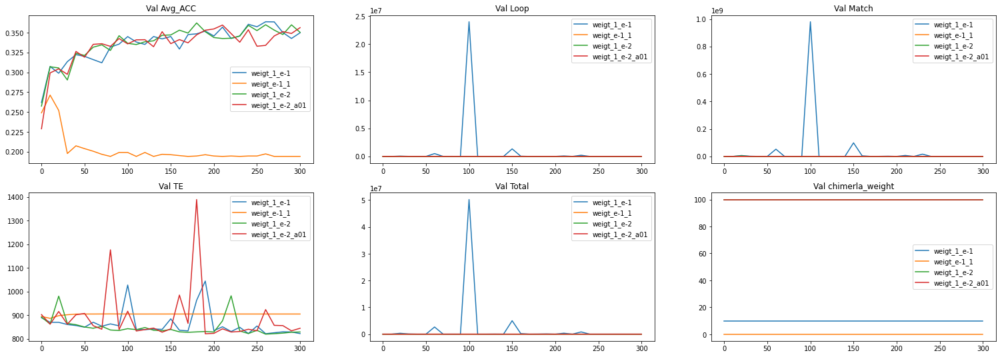

In [292]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(26,9)),layout=(2,3))

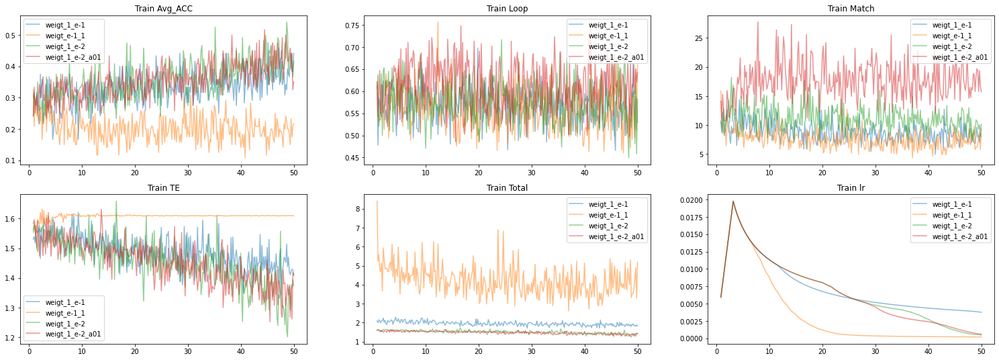

In [293]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(26,9)),layout=(2,3),dataset='train',start_from=5,alpha=0.5,mean_of_train=5)

## setting weight finding adam

In [175]:
log_path="/home/wergillius/Project/UTR_VAE/log/TWO_TASK_AT_MTL/weight_finder_Adam"
file_ls = [file for file in os.listdir(log_path) if '.log' in file]
file_path = [os.path.join(log_path,file) for file in file_ls]
log_name = [file.replace(".log","") for file in file_ls]

In [176]:
log_ls = [LAS.Log_parser(file) for file in file_path]

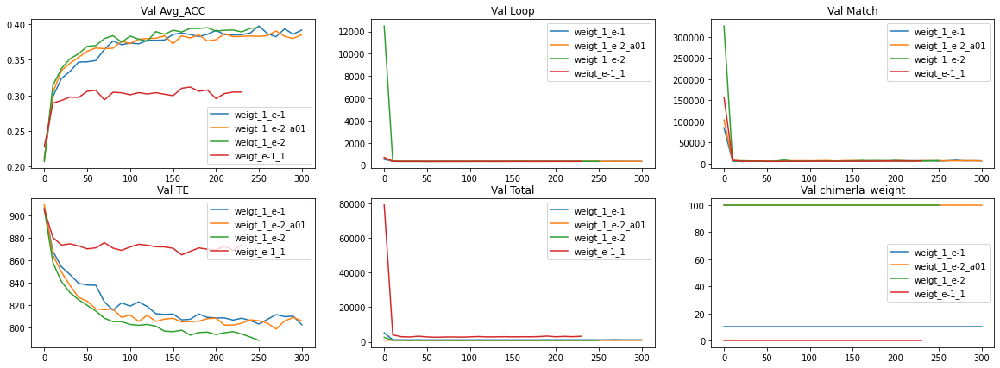

In [177]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(20,7)),layout=(2,3))

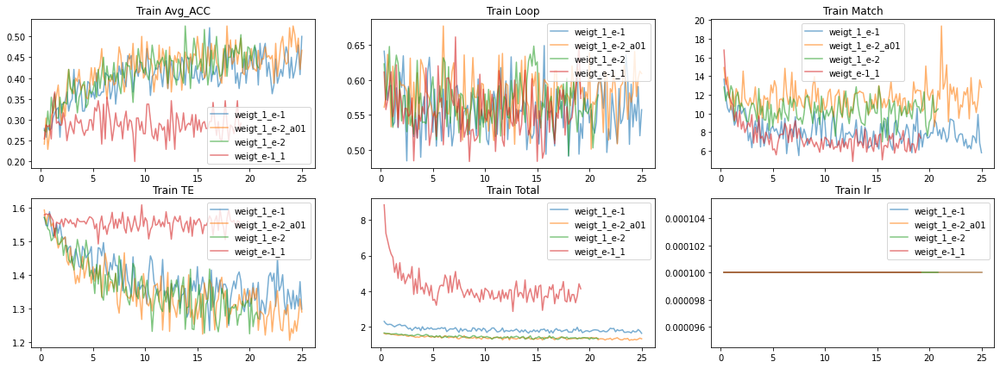

In [178]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(20,7)),layout=(2,3),dataset='train',mean_of_train=10,alpha=0.6,start_from=2)

## setting : slr

In [179]:
log_path="/home/wergillius/Project/UTR_VAE/log/TWO_TASK_AT_MTL/weight_finder_slr"
file_ls = [file for file in os.listdir(log_path) if '.log' in file]
file_path = [os.path.join(log_path,file) for file in file_ls]
log_name = [file.replace(".log","") for file in file_ls]

log_ls = [LAS.Log_parser(file) for file in file_path]

IndexError: index 1 is out of bounds for axis 0 with size 1

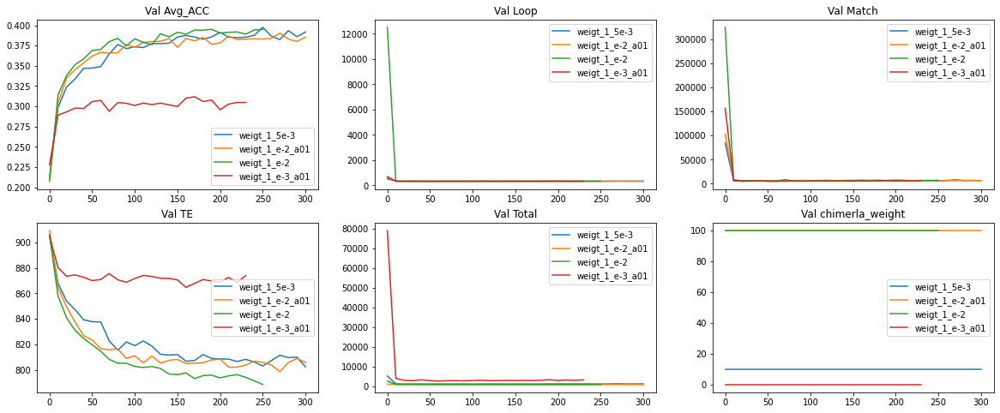

In [180]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(20,8)),layout=(2,3))

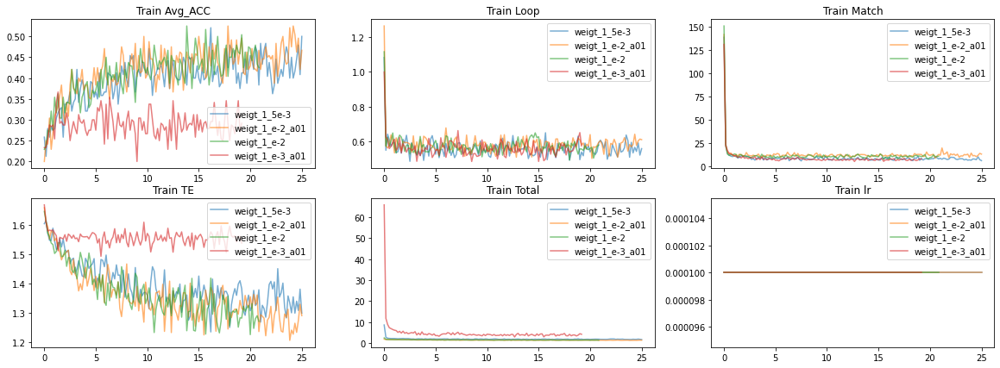

In [181]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(20,7)),layout=(2,3),dataset='train',mean_of_train=10,alpha=0.6)

## setting : blr

In [66]:
log_path="/home/wergillius/Project/UTR_VAE/log/TWO_TASK_AT_MTL/weight_finder_blr"
file_ls = [file for file in os.listdir(log_path) if '.log' in file]
file_path = [os.path.join(log_path,file) for file in file_ls]
log_name = [file.replace(".log","") for file in file_ls]

In [67]:
log_ls = [LAS.Log_parser(file) for file in file_path]

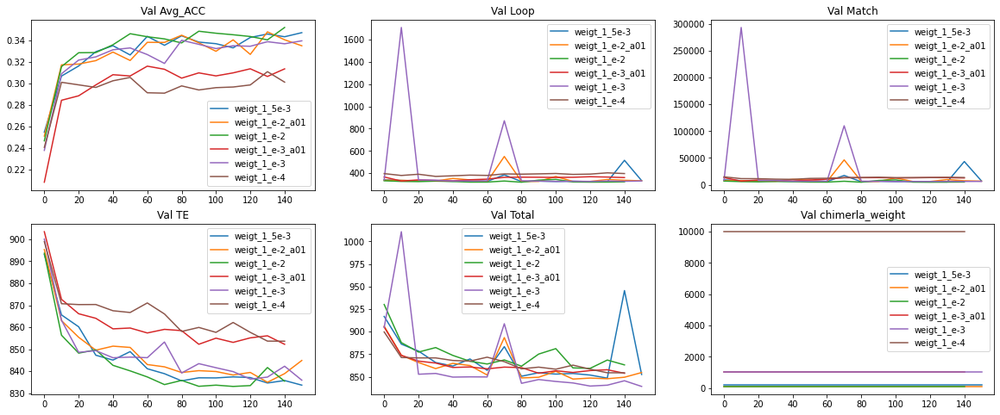

In [68]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(20,8)),layout=(2,3))

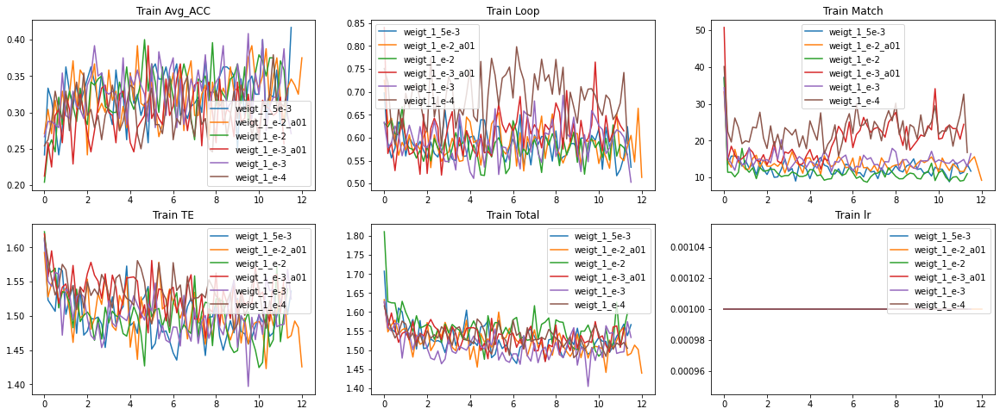

In [322]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(20,8)),layout=(2,3),mean_of_train=10,dataset='train',start_from=0)

## setting weight 0

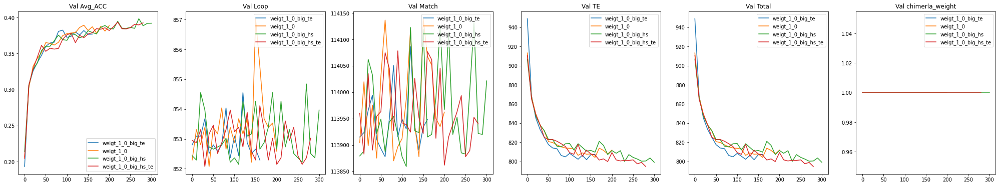

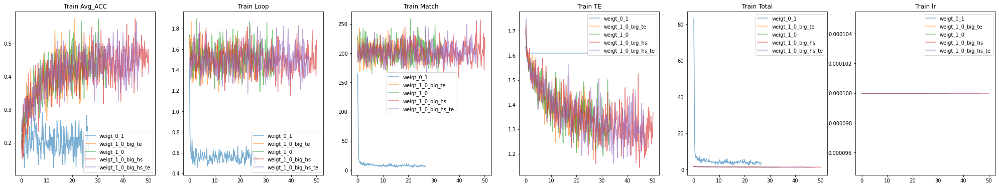

In [111]:
log_dir="/home/wergillius/Project/UTR_VAE/log/TWO_TASK_AT_MTL/weight_0"
log_file = [file for file in os.listdir(log_dir) if '.log' in file]
# log_file.remove("weigt_0_1.log")
log_path = [os.path.join(log_dir,file) for file in log_file]
log_name = [file.replace('.log','') for file in log_file]

log_path 

log_ls = [LAS.Log_parser(file) for file in log_path]

log_ls[3].val_metric

LAS.plot_a_exp_set(log_ls[1:],log_name[1:],fig=plt.figure(figsize=(35,6)))

LAS.plot_a_exp_set(log_ls,log_name,dataset='train',mean_of_train=5,fig=plt.figure(figsize=(35,6)),alpha=0.6)

# MODEL : TRANSFORMER_SEQ_TE

## setting : test_run

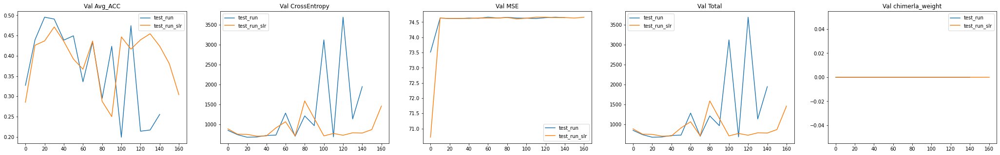

In [153]:
log_dir= "/home/wergillius/Project/UTR_VAE/log/TRANSFORMER_SEQ_TE_MTL/test_run"
log_file = [file for file in os.listdir(log_dir) if ".log" in file]
file_path = [os.path.join(log_dir,file) for file in log_file]
wf_slr_name = [file.replace('.log','') for file in log_file]
wf_slr_ls = [LAS.Log_parser(file) for file in file_path]

LAS.plot_a_exp_set(wf_slr_ls,wf_slr_name,fig=plt.figure(figsize=(36,5)))

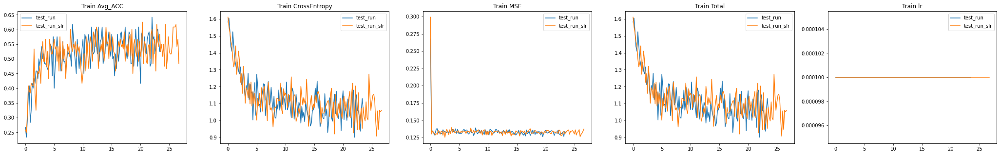

In [154]:
LAS.plot_a_exp_set(wf_slr_ls,wf_slr_name,fig=plt.figure(figsize=(36,5)),dataset='train',mean_of_train=5)

## setting : weight_finder_slr

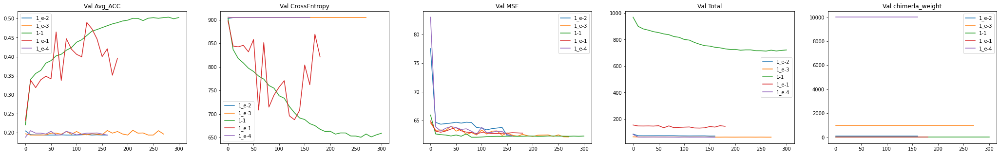

In [155]:
log_dir="/home/wergillius/Project/UTR_VAE/log/TRANSFORMER_SEQ_TE_MTL/weight_finder_slr"
log_file = [file for file in os.listdir(log_dir) if ".log" in file]
file_path = [os.path.join(log_dir,file) for file in log_file]
wf_slr_name = [file.replace('.log','') for file in log_file]
wf_slr_ls = [LAS.Log_parser(file) for file in file_path]

LAS.plot_a_exp_set(wf_slr_ls,wf_slr_name,fig=plt.figure(figsize=(36,5)))

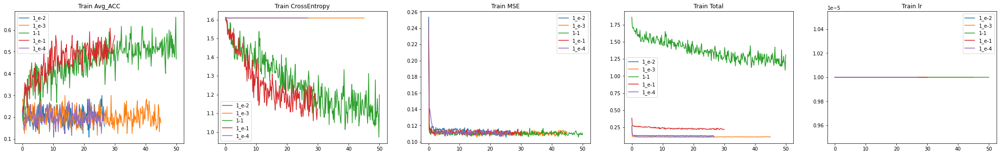

In [156]:
LAS.plot_a_exp_set(wf_slr_ls,wf_slr_name,fig=plt.figure(figsize=(36,5)),dataset='train',mean_of_train=5)

## setting : weight finder small learning rate 2

In [157]:
log_dir="/home/wergillius/Project/UTR_VAE/log/TRANSFORMER_SEQ_TE_MTL/weight_finder_slr2"
log_file = [file for file in os.listdir(log_dir) if ".log" in file]
file_path = [os.path.join(log_dir,file) for file in log_file]
log_name_wf2 = [file.replace(".log","") for file in log_file]

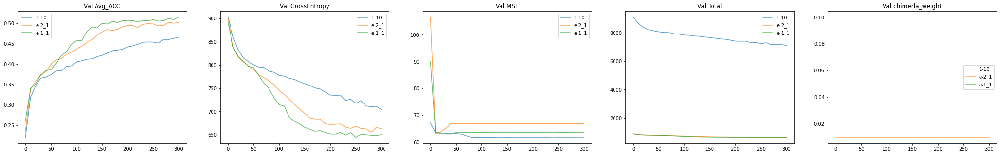

In [165]:
log_ls_wf2 = [LAS.Log_parser(file) for file in file_path]
LAS.plot_a_exp_set(log_ls_wf2,log_name_wf2,fig=plt.figure(figsize=(36,5)),alpha=0.7)

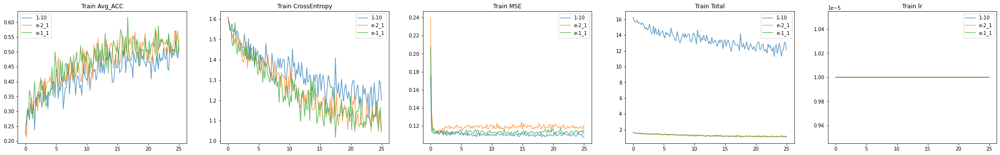

In [164]:
LAS.plot_a_exp_set(log_ls_wf2,log_name_wf2,dataset='train',mean_of_train=10,fig=plt.figure(figsize=(36,5)),alpha=0.7)

# MODEL：TRANSFORMER_SEQ_RL

## setting : test run

In [233]:
log_rl,log_rl_name = LAS.read_log_of_a_dir("/home/wergillius/Project/UTR_VAE/log/TRANSFORMER_SEQ_RL_MTL/test_run")

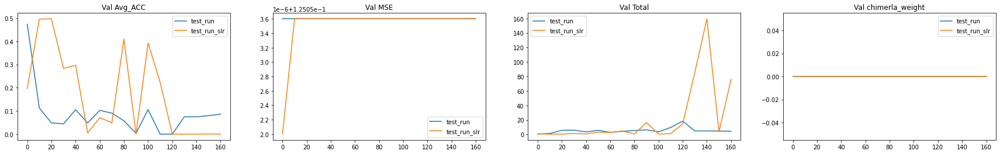

In [234]:
LAS.plot_a_exp_set(log_rl,log_rl_name,fig=plt.figure(figsize=(30,4)))

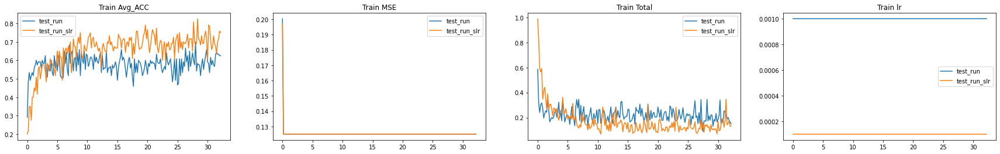

In [235]:
LAS.plot_a_exp_set(log_rl,log_rl_name,fig=plt.figure(figsize=(30,4)),dataset='train',mean_of_train=5)

## RL_Recons_8Motif

In [4]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/CrossStitch/CrossStitch_Model_MTL/RL_Reconst_8Motif"
file_name = [file for file in os.listdir(log_dir) if '.log' in file]
file_path = [os.path.join(log_dir,file) for file in file_name]

In [5]:
log_ls = [LAS.Log_parser(file) for file in file_path]
log_name = [file.split('.log')[0] for file in file_name]

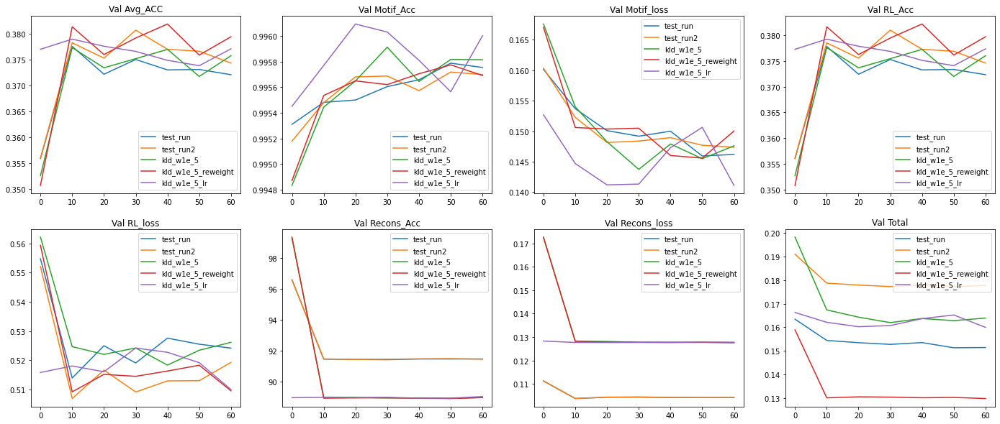

In [8]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(24,10)),layout=(2,4))

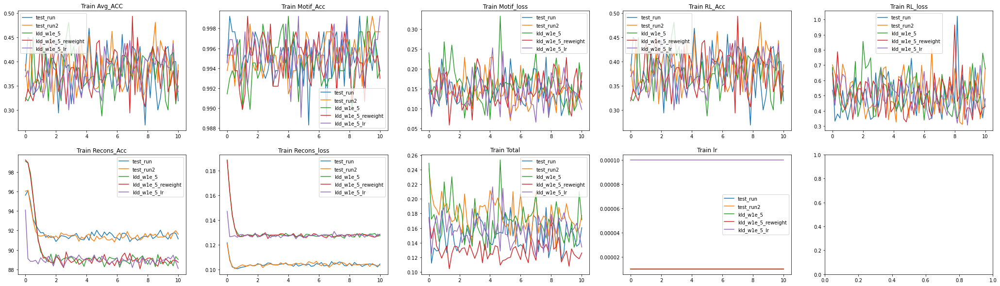

In [9]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(36,10)),layout=(2,5),dataset='train',mean_of_train=5)

In [10]:
gmaa_t2_blr = LAS.Log_parser('/home/wergillius/Project/UTR_VAE/log/CrossStitch/CrossStitch_Model_MTL/DTP/gamma_t2_blr.log')

### a5b5

In [11]:
log_ls,log_name = read_log_of_a_dir("/home/wergillius/Project/UTR_VAE/log/CrossStitch/CrossStitch_Model_MTL/a5b5")
log_ls = log_ls+[gmaa_t2_blr]
log_name = log_name+['gamma_t2_blr']

In [13]:
order=['Avg_ACC','Total','RL_Acc','RL_loss','Recons_Acc','Recons_loss','Motif_Acc','Motif_loss']

In [14]:
order=['Avg_ACC','RL_Acc','Recons_Acc','Motif_Acc','Total','RL_loss','Recons_loss','Motif_loss']

In [20]:
log_ls[1].val_verbose_DF

,Avg_ACC,RL_loss,Recons_loss,Motif_loss,Total,RL_Acc,Recons_Acc,Motif_Acc
0,0.140804,1.849032,0.065133,9.626619,3.704321,0.140884,0.797280,0.532972
1,0.409411,0.439763,0.057100,5.063418,0.487181,0.409645,0.820284,0.685019
2,0.467143,0.385713,0.028089,2.989675,0.226927,0.467410,0.922480,0.828406
3,0.490482,0.356965,0.009792,2.458794,0.131712,0.490763,0.976975,0.864157
4,0.474054,0.353558,0.007044,2.246764,0.156593,0.474325,0.982680,0.883625
5,0.493339,0.346164,0.005967,2.125328,0.120829,0.493621,0.985513,0.905095
6,0.480946,0.344859,0.005411,1.358144,0.094303,0.481221,0.989441,0.949619


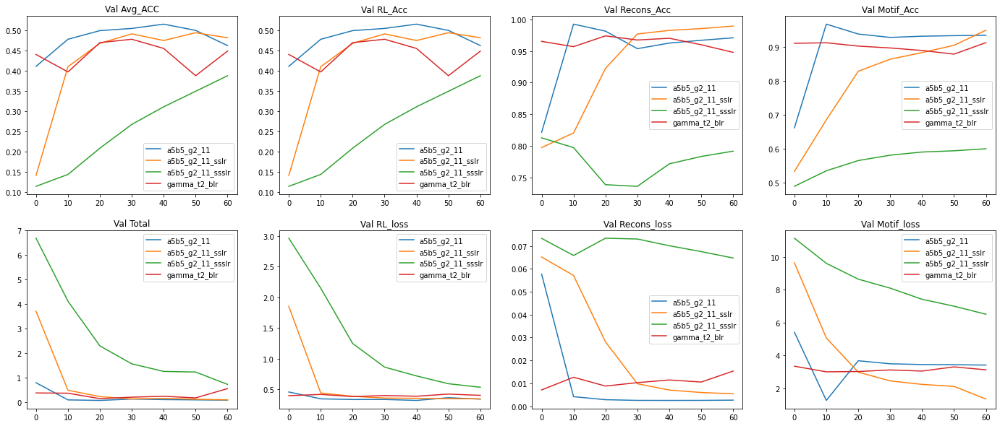

In [15]:
plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(24,10)),layout=(2,4),define_order=order)

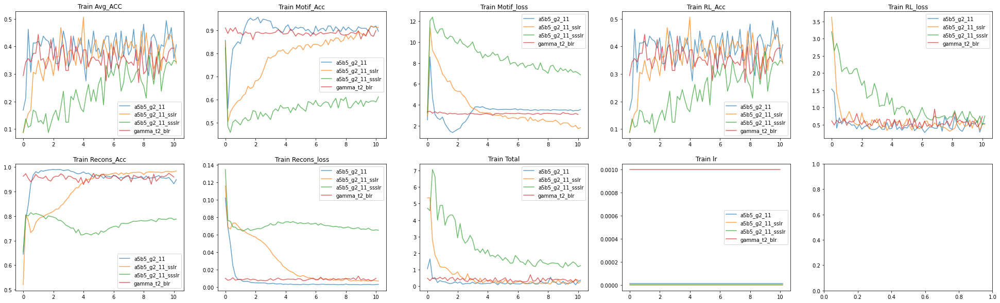

In [16]:
LAS.plot_a_exp_set(log_ls,log_name,fig=plt.figure(figsize=(34,10)),layout=(2,5),dataset='train',alpha=0.7,mean_of_train=5)

# MODEL : Cross Stitch

## big_Cov

In [18]:
log_dir = '/home/wergillius/Project/UTR_VAE/log/CrossStitch/CrossStitch_Model_MTL/big_Cov'

In [35]:
reload(LAS)

<module 'models.log_and_save' from '/home/wergillius/Project/UTR_VAE/models/log_and_save.py'>

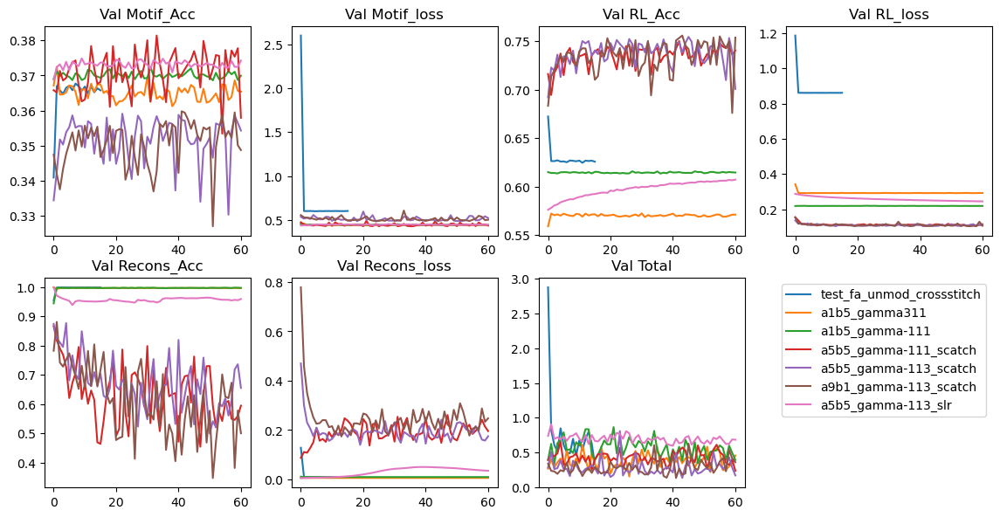

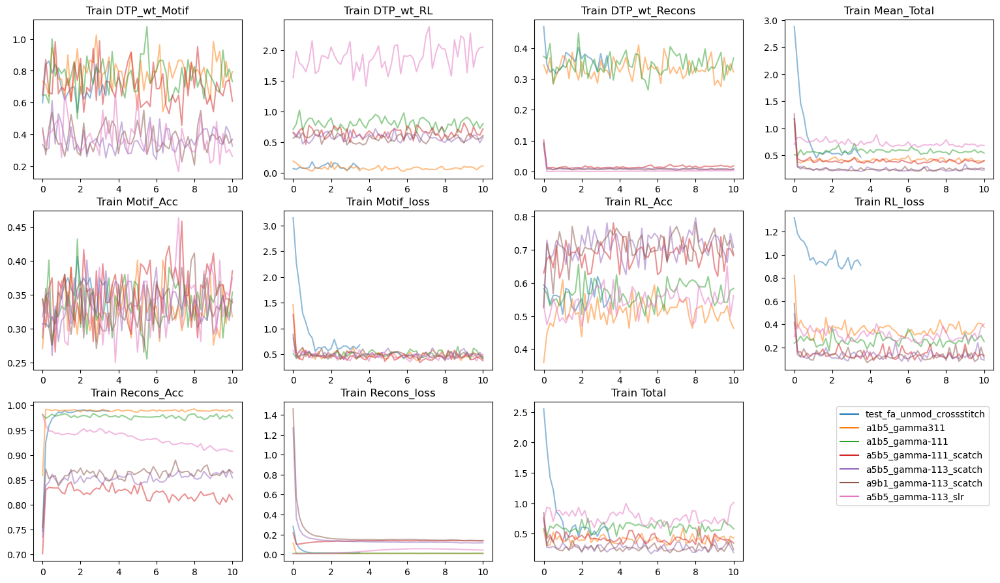

In [59]:
log_ls, log_name = LAS.read_log_of_a_dir(log_dir)

LAS.plot_a_exp_set(log_ls,log_name, dataset='val',check_time=1 , fig=plt.figure(figsize=(14,7),dpi=100),layout=(2,4))

LAS.plot_a_exp_set(log_ls,log_name, dataset='train',check_time=1 , fig=plt.figure(figsize=(19,11),dpi=100),layout=(3,4),alpha=0.5, mean_of_train=6)

## big_Cov_8motifline

In [60]:
log_dir = '/home/wergillius/Project/UTR_VAE/log/CrossStitch/CrossStitch_Model_MTL/big_Cov_8motif'

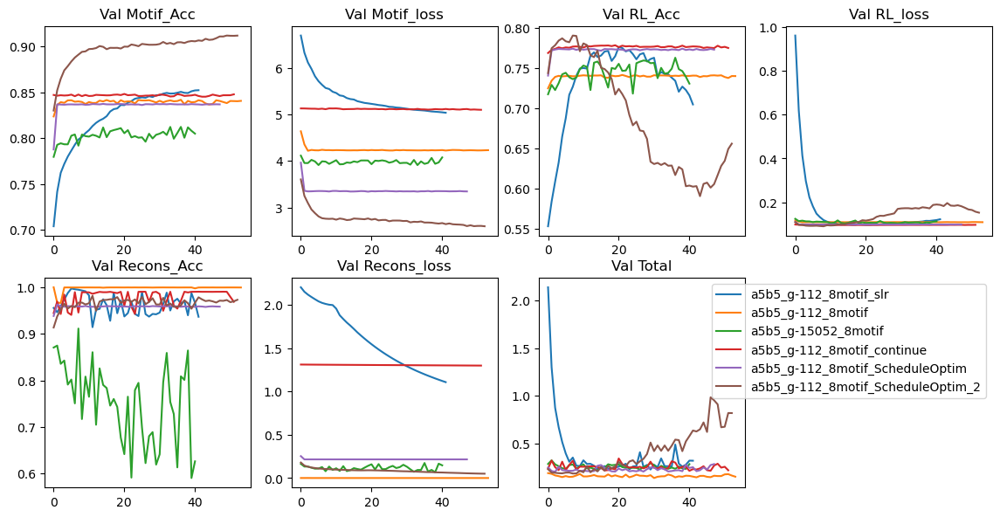

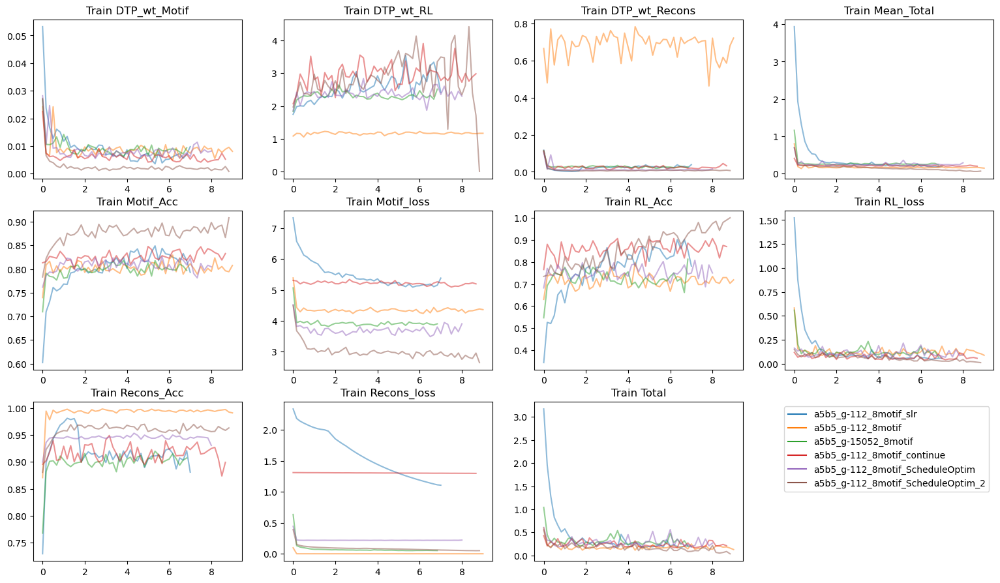

In [61]:
log_ls, log_name = LAS.read_log_of_a_dir(log_dir)

LAS.plot_a_exp_set(log_ls,log_name, dataset='val',check_time=1 , fig=plt.figure(figsize=(14,7),dpi=100),layout=(2,4))

LAS.plot_a_exp_set(log_ls,log_name, dataset='train',check_time=1 , fig=plt.figure(figsize=(19,11),dpi=100),layout=(3,4),alpha=0.5, mean_of_train=6)

## CrossStitch_clf

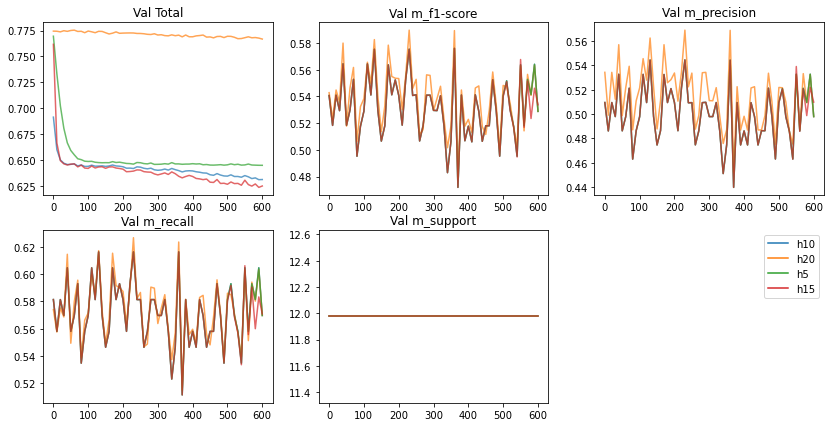

In [77]:
log_dir = '/home/wergillius/Project/UTR_VAE/log/CrossStitch/CrossStitch_clf/tune_hidden_size'

log_ls, log_name = read_log_of_a_dir(log_dir)

LAS.plot_a_exp_set(log_ls, log_name, fig=plt.figure(figsize=(14,7)), layout=(2,3), alpha=0.7)

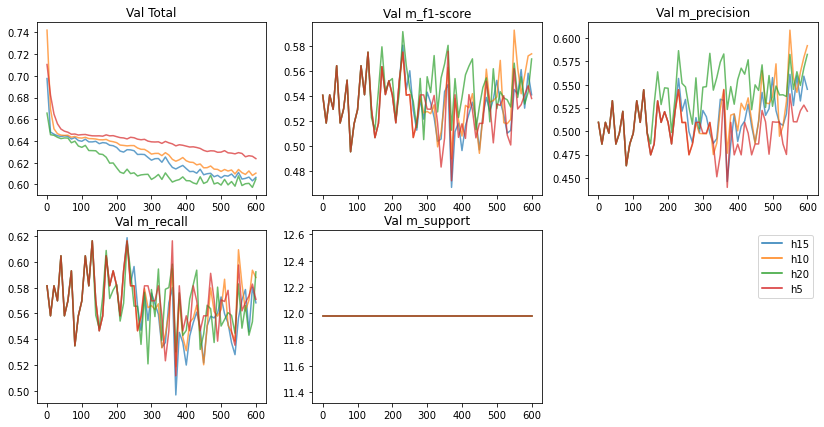

In [76]:
log_dir = '/home/wergillius/Project/UTR_VAE/log/CrossStitch/CrossStitch_clf/tune_hidden_size_l2e-4'

log_ls, log_name = read_log_of_a_dir(log_dir)

LAS.plot_a_exp_set(log_ls, log_name, fig=plt.figure(figsize=(14,7)), layout=(2,3), alpha=0.7)

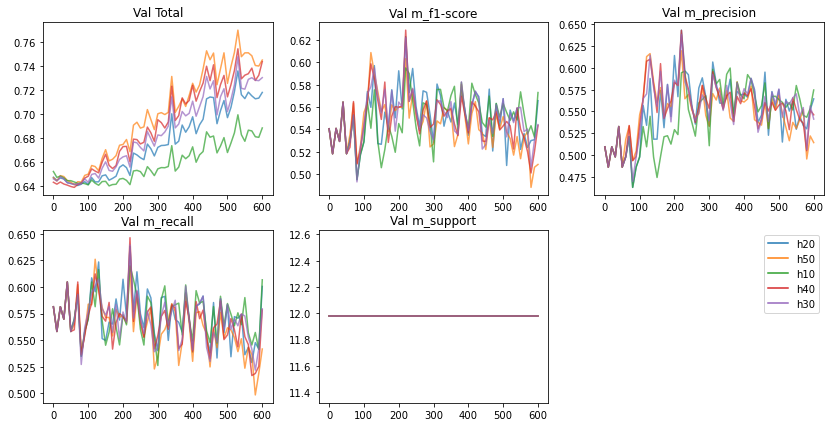

In [75]:
log_dir = '/home/wergillius/Project/UTR_VAE/log/CrossStitch/MLP_down_clf/tune_hidden_size'

log_ls, log_name = read_log_of_a_dir(log_dir)

LAS.plot_a_exp_set(log_ls, log_name, fig=plt.figure(figsize=(14,7)), layout=(2,3), alpha=0.7)

# MODEL : backbone

## RL_regressor_MTL/vali_by_deepest

In [44]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_regressor_MTL/vali_by_deepest"

In [48]:
log_file = [file for file in os.listdir(log_dir) if '.log' in file]
log_name_vali = [file.split('.log')[0] for file in log_file]
log_path = [os.path.join(log_dir,file) for file in log_file]

In [46]:
log_ls_vali = [LAS.Log_parser(file) for file in log_path]

In [49]:
log_name_vali

['RL_test',
 'loosen_l1',
 'loosen_l1_slr',
 'RL_test_l1_10epoch',
 'loosen_l1_slr_unsplit']

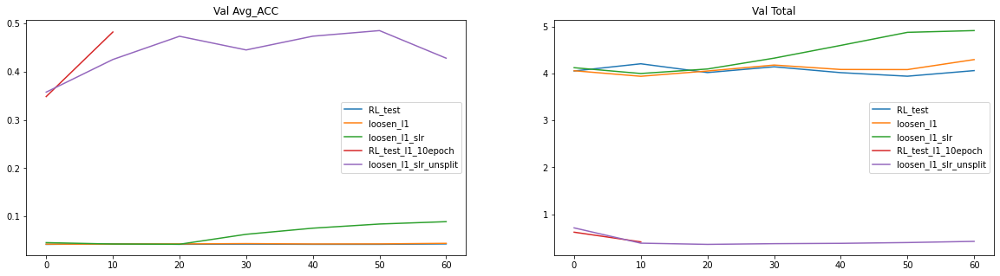

In [30]:
LAS.plot_a_exp_set(log_ls,log_name)

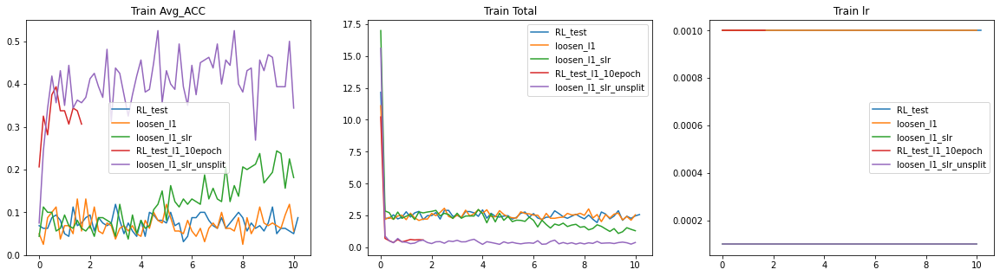

In [31]:
LAS.plot_a_exp_set(log_ls,log_name,dataset='train',mean_of_train=5)

## RL_regressor_MTL/deep_one

In [37]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_regressor_MTL/deep_one"

In [40]:
log_ls,log_name = read_log_of_a_dir(log_dir,use_line_as_valtest=0)

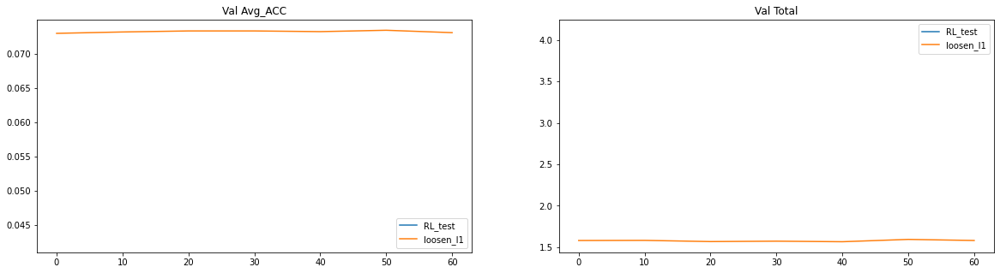

In [51]:
LAS.plot_a_exp_set(log_ls,log_name)

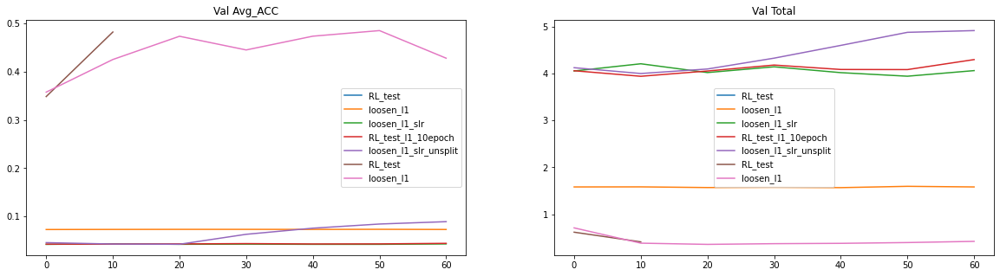

In [50]:
LAS.plot_a_exp_set(log_ls+log_ls_vali,log_name+log_name_vali)

## RL_regressor_MTL/split_two_csv

In [5]:
log_dir='/home/wergillius/Project/UTR_VAE/log/Backbone/RL_regressor_MTL/split_two_csv'
log_ls,log_name = read_log_of_a_dir(log_dir)

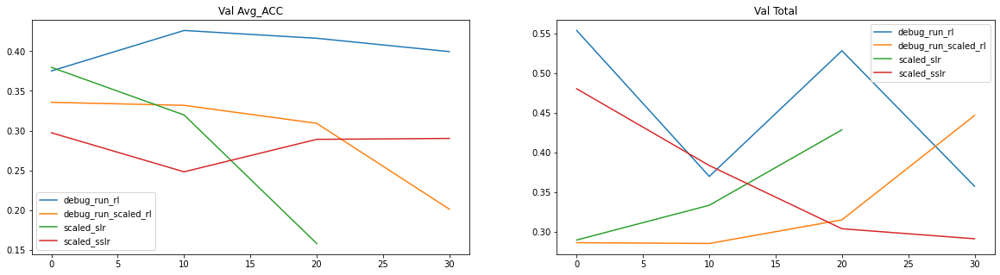

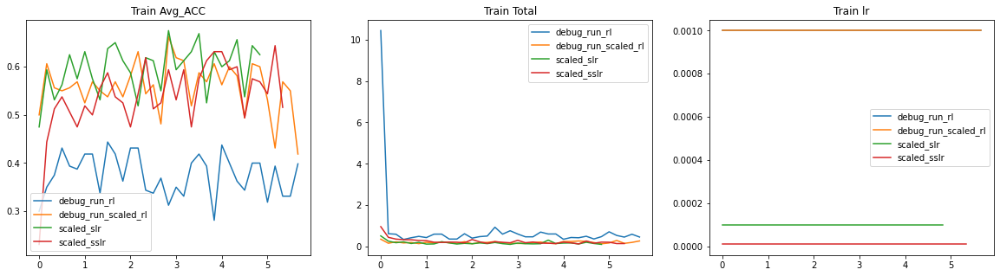

In [8]:
LAS.plot_a_exp_set(log_ls,log_name)

LAS.plot_a_exp_set(log_ls,log_name,dataset='train',mean_of_train=5)

In [32]:
log_dir="/home/wergillius/Project/UTR_VAE/log/Backbone/RL_regressor_MTL/split_two_csv_deep"
s2cd_ls,s2cd_name = read_log_of_a_dir(log_dir,use_line_as_valtest=0)

In [33]:
s2cd_name

['deep_one_scaled',
 'deep_one_unscaled',
 'unscaled_l1_slr',
 'unscaled_l1_sslr',
 'slr_l1_scaled']

In [34]:
[file for file in os.listdir(log_dir) if '.ini' in file]

['slr_l1_scaled.ini',
 'unscaled_l1_slr.ini',
 'unscaled_l1_sslr.ini',
 'deep_one_scaled.ini',
 'deep_one_unscaled.ini',
 'slr_l2_scaled.ini']

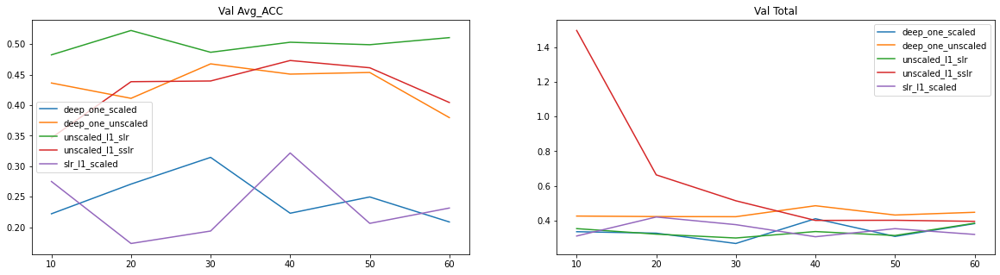

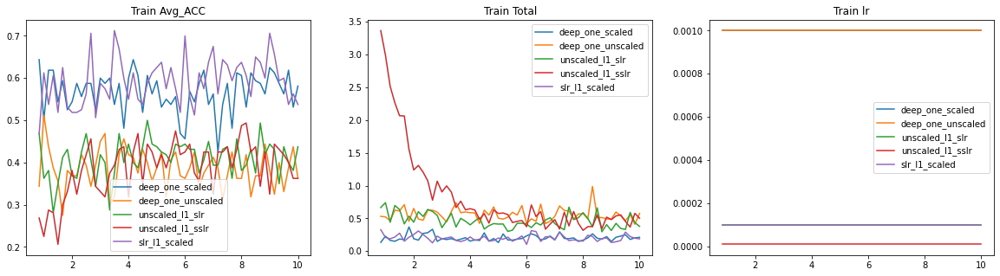

In [30]:
LAS.plot_a_exp_set(s2cd_ls,s2cd_name,start_from=1)
LAS.plot_a_exp_set(s2cd_ls,s2cd_name,dataset='train',start_from=5,mean_of_train=5)

## RL_regressor_MTL/split_two_csv_deep

## RL_regressor_MTL/human_vlength_dataset

In [110]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_regressor_MTL/human_vlength_dataset"
hv_log_ls,hv_log_name = read_log_of_a_dir(log_dir)

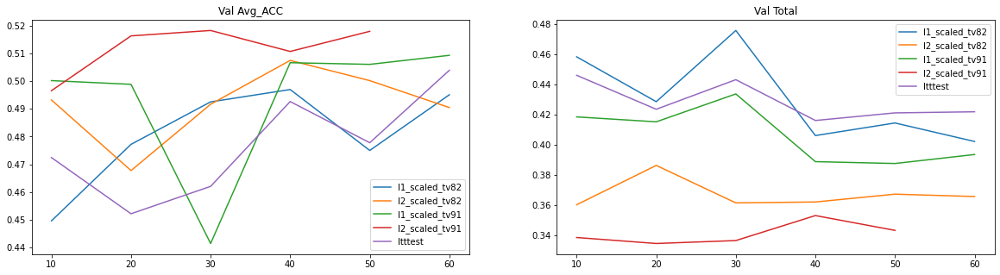

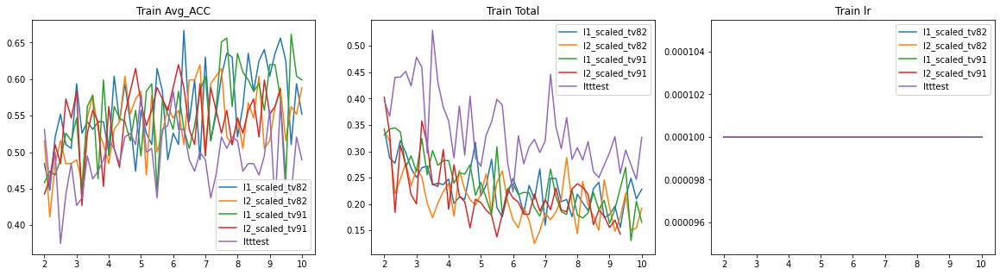

In [111]:
LAS.plot_a_exp_set(hv_log_ls,hv_log_name,start_from=1)
LAS.plot_a_exp_set(hv_log_ls,hv_log_name,dataset='train',mean_of_train=6,start_from=12)

## RL_gru_MTL / ds4rl_human

In [152]:
# ds4h_log_name[:-4] +
ds4h_log_name[-3:]

['vleng_model_human_data', 'big_RL_gru_lr_d03', 'big_RL_gru_lr3e5']

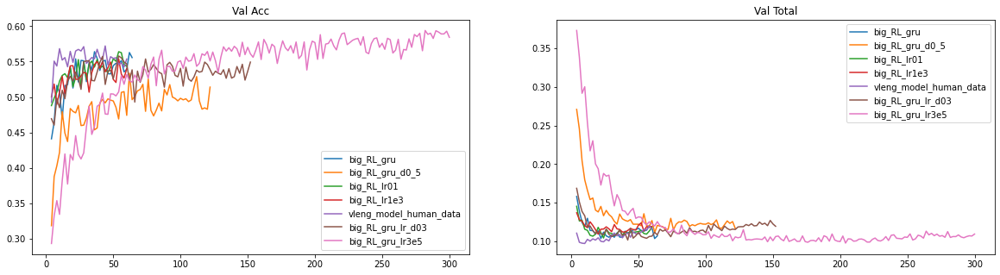

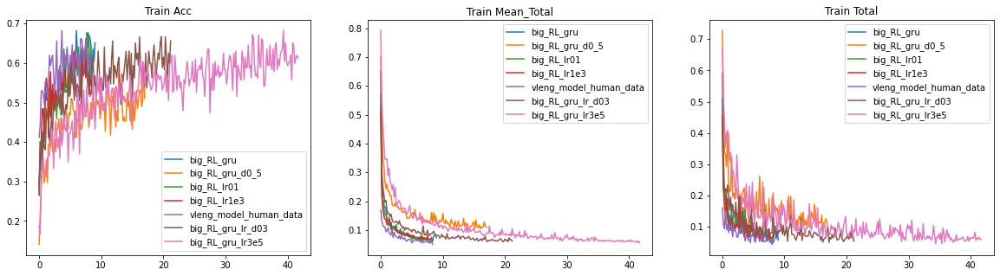

In [5]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_gru/ds4rl_human"
ds4h_log_ls , ds4h_log_name = read_log_of_a_dir(log_dir)

ds4h_log_ls = ds4h_log_ls[:-4] + ds4h_log_ls[-3:]
ds4h_log_name = ds4h_log_name[:-4] + ds4h_log_name[-3:]


# plt.set_style('')
LAS.plot_a_exp_set(ds4h_log_ls, ds4h_log_name, check_time=2,start_from=2)
LAS.plot_a_exp_set(ds4h_log_ls, ds4h_log_name, check_time=2,dataset='train',mean_of_train=6)

## RL_gru_MTL / ds4rl_unmod1

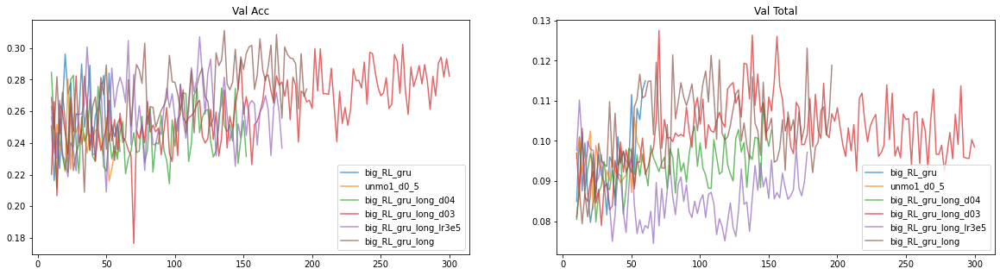

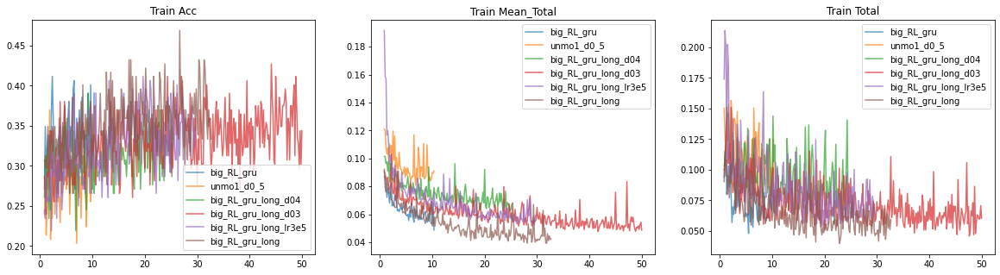

In [140]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_gru/ds4rl_unmod1"
ds4un_log_ls,ds4un_log_name = read_log_of_a_dir(log_dir)

LAS.plot_a_exp_set(ds4un_log_ls, ds4un_log_name, check_time=2, start_from=5, alpha=0.7)
LAS.plot_a_exp_set(ds4un_log_ls, ds4un_log_name, check_time=2,dataset='train',mean_of_train=6, start_from=5, alpha=0.7)

## RL_gru_MTL / ds4rl_vleng

In [114]:
from importlib import reload
reload(LAS)

<module 'models.log_and_save' from '/home/wergillius/Project/UTR_VAE/models/log_and_save.py'>

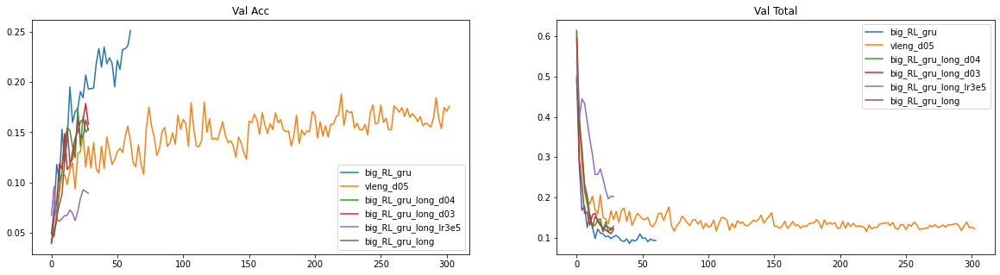

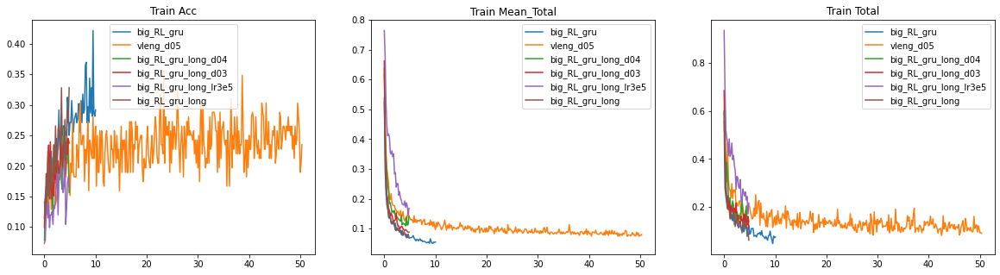

In [155]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_gru/ds4rl_vleng"
ds4v_log_ls, ds4v_log_name = read_log_of_a_dir(log_dir)

LAS.plot_a_exp_set(ds4v_log_ls, ds4v_log_name , check_time=2 )
LAS.plot_a_exp_set(ds4v_log_ls, ds4v_log_name , check_time=2 , dataset='train', mean_of_train=6)

## RL_gru / cycele_unmod1

In [104]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_gru/cycle_unmod1"
cycle_log_ls, cycle_log_name = LAS.read_log_of_a_dir(log_dir)

In [105]:
reload(LAS)

<module 'models.log_and_save' from '/home/wergillius/Project/UTR_VAE/models/log_and_save.py'>

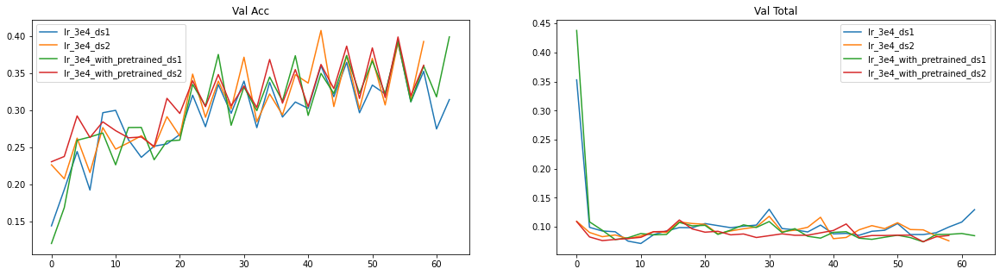

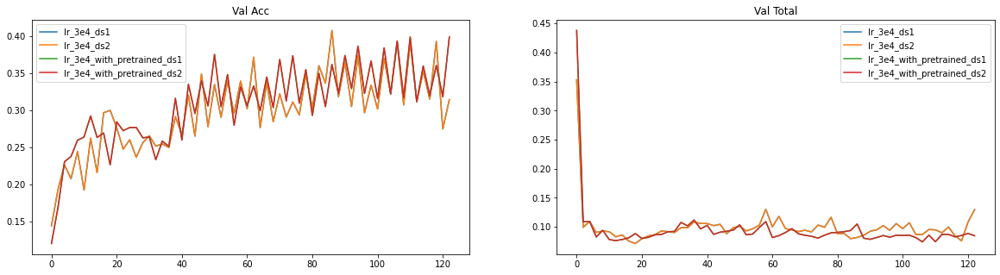

In [109]:
LAS.plot_cycle_exp_set(cycle_log_ls[1:], cycle_log_name[1:], check_time=2 , dataset = 'val')
LAS.plot_cycle_exp_set(cycle_log_ls[1:], cycle_log_name[1:], dataset='train', check_time=2 )

## RL_gru / ds4rl_human reset

In [19]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_gru/ds4rl_human_reset"
log_ls, log_name = LAS.read_log_of_a_dir(log_dir)

In [20]:
log_ls

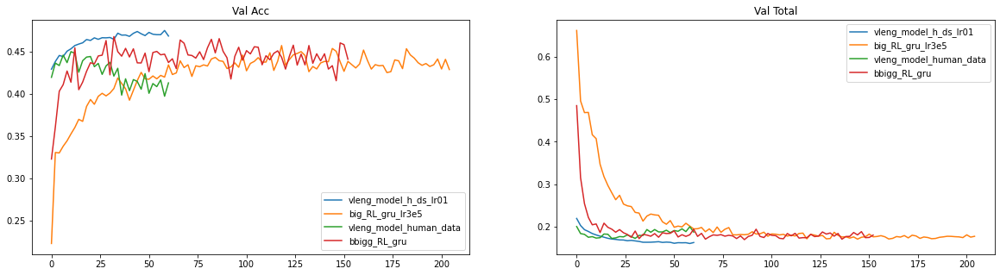

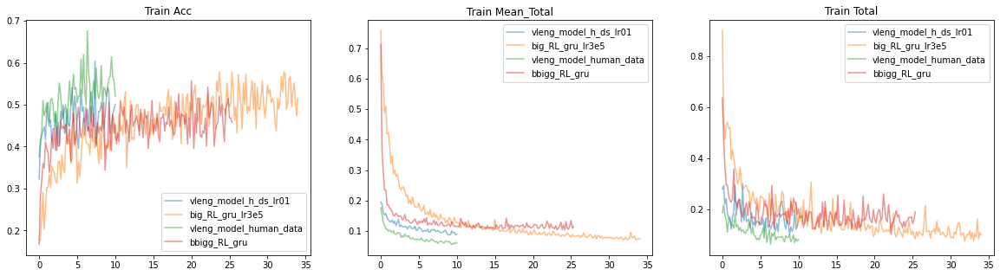

In [21]:
LAS.plot_a_exp_set(log_ls, log_name, check_time=2 , dataset = 'val')
LAS.plot_a_exp_set(log_ls, log_name, dataset='train', check_time=2, mean_of_train=6,alpha=0.5 )

## RL_gru / ds4rl_unmode1 new

In [22]:
log_dir = "/home/wergillius/Project/UTR_VAE/log/Backbone/RL_gru/ds4rl_unmod1_new"
log_ls, log_name = LAS.read_log_of_a_dir(log_dir)

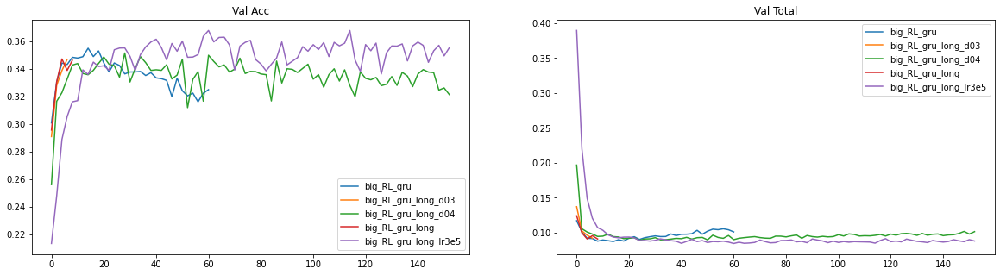

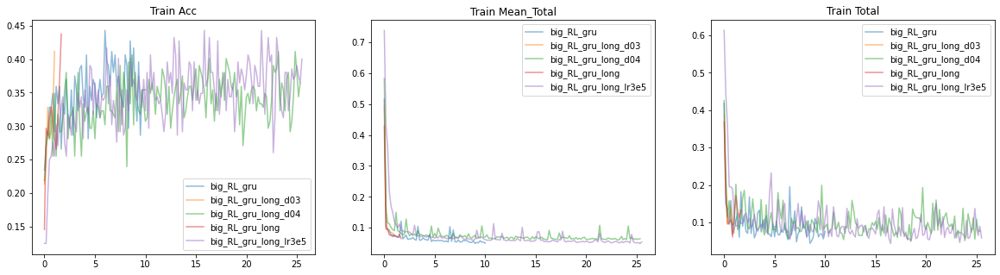

In [23]:
LAS.plot_a_exp_set(log_ls, log_name, check_time=2 , dataset = 'val')
LAS.plot_a_exp_set(log_ls, log_name, dataset='train', check_time=2, mean_of_train=6,alpha=0.5 )